# MÉTODO DE ENTRADA DE VENTANA FECHA Y VALOR 2016 - 672

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [2]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from array import *
from pickle import dump
import math

import numpy as np
import pandas as pd
import seaborn as sns

np.random.seed(123)

from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
FILEPATH = "../../datasources/THC-id-17.csv"
df_original = pd.read_csv(FILEPATH, parse_dates=True)

FILEPATH = "../../datasources/THC-id-17-preprocessed.csv"
df = pd.read_csv(FILEPATH, parse_dates=True)

In [4]:
df_original

,datetime,id,value
0,2019-01-01 03:00:00,17.0,0.087
1,2019-01-01 03:15:00,17.0,0.100
2,2019-01-01 03:30:00,17.0,0.084
3,2019-01-01 03:45:00,17.0,0.057
4,2019-01-01 04:00:00,17.0,0.167
...,...,...,...
64588,2020-11-03 22:00:00,17.0,0.031
64589,2020-11-03 22:15:00,17.0,0.055
64590,2020-11-03 22:30:00,17.0,0.019
64591,2020-11-03 22:45:00,17.0,0.021


In [5]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


In [6]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


### División de los datos

In [7]:
train_df, aux = train_test_split(df, test_size=0.3, shuffle=False)
test_df, val_df = train_test_split(aux, test_size=0.5, shuffle=False)

In [8]:
train_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
45210,0.382683,0.923880,0.056070,0.998427,0.968510,-0.248976,0.041
45211,0.442289,0.896873,0.065403,0.997859,0.968465,-0.249150,0.024
45212,0.500000,0.866025,0.074730,0.997204,0.968420,-0.249323,0.017
45213,0.555570,0.831470,0.084051,0.996461,0.968376,-0.249497,0.046


In [9]:
test_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
45215,6.593458e-01,0.751840,0.102669,0.994716,0.968286,-0.249844,0.016
45216,7.071068e-01,0.707107,0.111964,0.993712,0.968241,-0.250017,0.046
45217,7.518398e-01,0.659346,0.121251,0.992622,0.968197,-0.250191,0.009
45218,7.933533e-01,0.608761,0.130526,0.991445,0.968152,-0.250364,0.003
45219,8.314696e-01,0.555570,0.139790,0.990181,0.968107,-0.250538,0.034
...,...,...,...,...,...,...,...
54899,-6.540313e-02,0.997859,0.442289,-0.896873,-0.405068,-0.914287,0.018
54900,-5.539676e-12,1.000000,0.433884,-0.900969,-0.405231,-0.914214,0.018
54901,6.540313e-02,0.997859,0.425441,-0.904986,-0.405395,-0.914142,0.038
54902,1.305262e-01,0.991445,0.416961,-0.908924,-0.405559,-0.914069,0.039


In [10]:
val_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
54904,0.258819,0.965926,0.399892,-0.916562,-0.405887,-0.913923,0.018
54905,0.321439,0.946930,0.391305,-0.920261,-0.406050,-0.913851,0.017
54906,0.382683,0.923880,0.382683,-0.923880,-0.406214,-0.913778,0.018
54907,0.442289,0.896873,0.374029,-0.927417,-0.406378,-0.913705,0.048
54908,0.500000,0.866025,0.365341,-0.930874,-0.406541,-0.913632,0.024
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


## Funciones auxiliares

In [11]:
def split_data(data, n_input, n_out):
    X, y = list(), list()
    in_start = 0
    
    for _ in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        if out_end <= len(data):
            X.append(np.array(data.iloc[in_start:in_end, :]))
            y.append(np.array(data.iloc[in_end:out_end, -1]))
        in_start += 1
        
    return np.array(X).reshape(len(X), n_input, data.shape[1]), np.array(y)

In [12]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mae'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.show()

In [13]:
def plot_window_predictions(index_min, index_max, real_outputs, pred_outputs, num_plots, start):
    for n in range(start, start + num_plots):
        limit = index_min + n + n_entrada
        input_indices = np.array(df_original['datetime'].iloc[index_min + n : limit])
        input_values = np.array(df_original['value'].iloc[index_min + n : limit])
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        real_values = real_outputs[n]
        pred_values = pred_outputs[n]
        
        plt.figure()
        plt.xlabel('Time')
        plt.ylabel(f'Valores de prediccion - Iteracion {n+1}')
        plt.scatter(input_indices, input_values, color='b',zorder=2)
        plt.plot(input_indices, input_values, label='Inputs', color='b', zorder=1)
        plt.scatter(output_indices, real_values, edgecolors='k', label='Real output', c='#2ca02c', s=64)
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)
        plt.legend()

In [14]:
def plot_window_predictions_values(index_min, pred_outputs, max_plots):
    plt.figure()
    plt.xlabel('Time')
    plt.ylabel(f'Valores de prediccion')
    plt.plot(np.array(df_original['datetime'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             np.array(df_original['value'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             color='b', zorder=1)
    
    for n in range(max_plots):
        limit = index_min + n + n_entrada
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        pred_values = pred_outputs[n]
        
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)

In [15]:
import tensorflow.keras.backend as K

def smape(y_true, y_pred):
    return K.mean(2*K.abs(y_pred-y_true)/(K.abs(y_true)+K.abs(y_pred)))

## Parámetros
####  En este caso vamos a generar una ventana de 2016 valores de entrada que corresponde a las 3 semanas anteriores y una salida de 672 valores que corresponden al consumo de la siguiente semana

In [16]:
###### PARAMETERS ######
n_epochs = 200
batch_size = 128
n_entrada = 2016           # Número de mediciones en las 3 semanas anteriores
n_predicciones = 672       # Mediciones en una semana
n_features = df.shape[1] 
########################

## Extraer datos de entrada y salida

In [17]:
data_trainX, data_trainY = split_data(train_df, n_entrada, n_predicciones)
data_valX, data_valY = split_data(val_df, n_entrada, n_predicciones)
data_testX, data_testY = split_data(test_df, n_entrada, n_predicciones)

In [18]:
data_trainX.shape

(42528, 2016, 7)

In [19]:
data_trainY.shape

(42528, 672)

In [20]:
data_valX.shape

(7002, 2016, 7)

In [21]:
data_valY.shape

(7002, 672)

In [22]:
data_testX.shape

(7002, 2016, 7)

In [23]:
data_testY.shape

(7002, 672)

In [24]:
data_trainX[0]

array([[ 0.70710678,  0.70710678, -0.99371221, ...,  0.00417166,
         0.9999913 ,  0.087     ],
       [ 0.75183981,  0.65934582, -0.99471562, ...,  0.00435086,
         0.99999053,  0.1       ],
       [ 0.79335334,  0.60876143, -0.99563208, ...,  0.00453005,
         0.99998974,  0.084     ],
       ...,
       [ 0.55557023,  0.83146961, -0.99018113, ...,  0.35684879,
         0.93416216,  0.362     ],
       [ 0.60876143,  0.79335334, -0.99144486, ...,  0.35701618,
         0.9340982 ,  0.305     ],
       [ 0.65934582,  0.75183981, -0.99262192, ...,  0.35718356,
         0.93403421,  0.055     ]])

In [25]:
data_trainY[0]

array([0.126, 0.04 , 0.017, 0.019, 0.022, 0.012, 0.131, 0.004, 0.037,
       0.009, 0.026, 0.015, 0.014, 0.028, 0.004, 0.036, 0.004, 0.024,
       0.017, 0.009, 0.031, 0.004, 0.032, 0.008, 0.017, 0.022, 0.004,
       0.035, 0.004, 0.025, 0.014, 0.011, 0.028, 0.004, 0.032, 0.007,
       0.022, 0.063, 0.015, 0.081, 0.025, 0.017, 0.032, 0.011, 0.037,
       0.016, 0.252, 0.422, 0.316, 0.028, 0.216, 0.448, 0.209, 0.03 ,
       0.152, 0.051, 0.03 , 0.052, 0.051, 0.107, 0.088, 0.051, 0.026,
       0.051, 0.038, 0.036, 0.051, 0.051, 0.041, 0.018, 0.056, 0.06 ,
       0.114, 0.187, 0.054, 0.207, 0.265, 0.25 , 0.156, 0.057, 0.198,
       0.045, 0.063, 0.061, 0.166, 0.322, 0.062, 0.062, 0.229, 0.428,
       0.159, 0.062, 0.17 , 0.059, 0.069, 0.045, 0.049, 0.037, 0.046,
       0.014, 0.029, 0.014, 0.028, 0.015, 0.027, 0.016, 0.025, 0.017,
       0.023, 0.018, 0.023, 0.017, 0.022, 0.022, 0.02 , 0.021, 0.016,
       0.024, 0.012, 0.028, 0.007, 0.034, 0.004, 0.036, 0.005, 0.029,
       0.01 , 0.024,

## Estandarización y normalización de los datos

In [26]:
# Normalizado
maxabs_scaler = MaxAbsScaler()
    
maxabs_scaler.fit(data_trainX.reshape(-1, data_trainX.shape[-1]))
    
scaled_trainX = maxabs_scaler.transform(data_trainX.reshape(-1, data_trainX.shape[-1])).reshape(data_trainX.shape)
scaled_valX = maxabs_scaler.transform(data_valX.reshape(-1, data_valX.shape[-1])).reshape(data_valX.shape)
scaled_testX = maxabs_scaler.transform(data_testX.reshape(-1, data_testX.shape[-1])).reshape(data_testX.shape)

In [27]:
scaled_trainX.shape

(42528, 2016, 7)

In [28]:
scaled_valX.shape

(7002, 2016, 7)

In [29]:
scaled_testX.shape

(7002, 2016, 7)

In [30]:
scaled_trainX[0]

array([[ 0.70710678,  0.70710678, -0.99371221, ...,  0.00417166,
         0.9999913 ,  0.12869822],
       [ 0.75183981,  0.65934582, -0.99471562, ...,  0.00435086,
         0.99999053,  0.14792899],
       [ 0.79335334,  0.60876143, -0.99563208, ...,  0.00453005,
         0.99998974,  0.12426036],
       ...,
       [ 0.55557023,  0.83146961, -0.99018113, ...,  0.35684879,
         0.93416216,  0.53550296],
       [ 0.60876143,  0.79335334, -0.99144486, ...,  0.35701618,
         0.9340982 ,  0.45118343],
       [ 0.65934582,  0.75183981, -0.99262192, ...,  0.35718356,
         0.93403421,  0.08136095]])

### Algunos modelos necesitan otros tipos de entrada

In [31]:
scaled_trainX_4D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, n_entrada, n_features)
scaled_valX_4D = scaled_valX.reshape(scaled_valX.shape[0], 1, n_entrada, n_features)
scaled_testX_4D = scaled_testX.reshape(scaled_testX.shape[0], 1, n_entrada, n_features)

scaled_trainX_5D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, 1, n_entrada, n_features)
scaled_valX_5D = scaled_valX.reshape(scaled_valX.shape[0], 1, 1, n_entrada, n_features)
scaled_testX_5D = scaled_testX.reshape(scaled_testX.shape[0], 1, 1, n_entrada, n_features)

data_trainY_3D = data_trainY.reshape(data_trainY.shape[0], 1, n_predicciones)
data_valY_3D = data_valY.reshape(data_valY.shape[0], 1, n_predicciones)
data_testY_3D = data_testY.reshape(data_testY.shape[0], 1, n_predicciones)

data_trainY_3D_2 = data_trainY.reshape(data_trainY.shape[0], n_predicciones, 1)
data_valY_3D_2 = data_valY.reshape(data_valY.shape[0], n_predicciones, 1)
data_testY_3D_2 = data_testY.reshape(data_testY.shape[0], n_predicciones, 1)

### Early stopping

In [32]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

# MODELO 2: LSTM DE DOS CAPAS

### Construimos el modelo

In [33]:
def build_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [34]:
model2 = build_model2()
model2.summary()

2022-06-24 23:34:20.546150: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-24 23:34:20.985235: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 29337 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:5b:00.0, compute capability: 7.0


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 2016, 128)         69632     
                                                                 
 lstm_1 (LSTM)               (None, 128)               131584    
                                                                 
 dense (Dense)               (None, 672)               86688     
                                                                 
Total params: 287,904
Trainable params: 287,904
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [35]:
history2 = model2.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-24 23:34:28.555686: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


333/333 [==============================] - 81s 234ms/step - loss: 0.0063 - mae: 0.0473 - mse: 0.0063 - smape: 0.8571 - val_loss: 0.0068 - val_mae: 0.0482 - val_mse: 0.0068 - val_smape: 0.8905
Epoch 2/200
333/333 [==============================] - 76s 229ms/step - loss: 0.0057 - mae: 0.0450 - mse: 0.0057 - smape: 0.8030 - val_loss: 0.0069 - val_mae: 0.0480 - val_mse: 0.0069 - val_smape: 0.8686
Epoch 3/200
333/333 [==============================] - 77s 230ms/step - loss: 0.0055 - mae: 0.0438 - mse: 0.0055 - smape: 0.7820 - val_loss: 0.0070 - val_mae: 0.0475 - val_mse: 0.0070 - val_smape: 0.8645
Epoch 4/200
333/333 [==============================] - 77s 231ms/step - loss: 0.0054 - mae: 0.0431 - mse: 0.0054 - smape: 0.7730 - val_loss: 0.0071 - val_mae: 0.0476 - val_mse: 0.0071 - val_smape: 0.8582
Epoch 5/200
333/333 [==============================] - 77s 230ms/step - loss: 0.0053 - mae: 0.0428 - mse: 0.0053 - smape: 0.7679 - val_loss: 0.0070 - val_mae: 0.0465 - val_mse: 0.0070 - val_smape:

333/333 [==============================] - 76s 229ms/step - loss: 0.0043 - mae: 0.0398 - mse: 0.0043 - smape: 0.7835 - val_loss: 0.0080 - val_mae: 0.0507 - val_mse: 0.0080 - val_smape: 0.9327
Epoch 42/200
333/333 [==============================] - 76s 229ms/step - loss: 0.0042 - mae: 0.0397 - mse: 0.0042 - smape: 0.7849 - val_loss: 0.0081 - val_mae: 0.0510 - val_mse: 0.0081 - val_smape: 0.9421
Epoch 43/200
333/333 [==============================] - 77s 230ms/step - loss: 0.0042 - mae: 0.0397 - mse: 0.0042 - smape: 0.7862 - val_loss: 0.0080 - val_mae: 0.0506 - val_mse: 0.0080 - val_smape: 0.9345
Epoch 44/200
333/333 [==============================] - 77s 231ms/step - loss: 0.0042 - mae: 0.0397 - mse: 0.0042 - smape: 0.7874 - val_loss: 0.0081 - val_mae: 0.0510 - val_mse: 0.0081 - val_smape: 0.9373
Epoch 45/200
333/333 [==============================] - 77s 230ms/step - loss: 0.0042 - mae: 0.0396 - mse: 0.0042 - smape: 0.7883 - val_loss: 0.0080 - val_mae: 0.0505 - val_mse: 0.0080 - val_sm

In [36]:
hist2 = pd.DataFrame(history2.history)
hist2['epoch'] = history2.epoch
hist2

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006260,0.047298,0.006260,0.857122,0.006772,0.048179,0.006772,0.890519,0
1,0.005687,0.045006,0.005687,0.802966,0.006862,0.047969,0.006862,0.868576,1
2,0.005500,0.043835,0.005500,0.781962,0.006962,0.047458,0.006962,0.864476,2
3,0.005379,0.043125,0.005379,0.773006,0.007145,0.047641,0.007145,0.858166,3
4,0.005308,0.042775,0.005308,0.767864,0.007029,0.046488,0.007029,0.832055,4
5,0.005261,0.042546,0.005261,0.764043,0.007090,0.047047,0.007090,0.828923,5
6,0.005216,0.042342,0.005216,0.762191,0.007284,0.047036,0.007284,0.822887,6
7,0.005174,0.042131,0.005174,0.759825,0.007408,0.047541,0.007408,0.822844,7
8,0.005132,0.041947,0.005132,0.758241,0.007294,0.047233,0.007294,0.829787,8
9,0.005068,0.041688,0.005068,0.756835,0.007402,0.047431,0.007402,0.836133,9


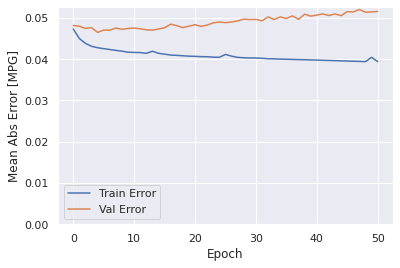

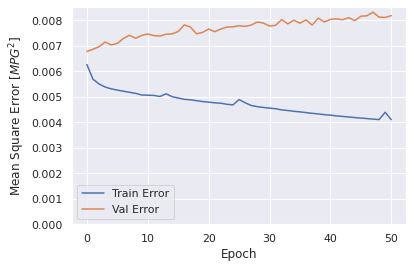

In [37]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history2)

### Evaluar predicciones

In [38]:
score_train2 = model2.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train2[0]}')
print(f'MAE:{score_train2[1]}')
print(f'MSE:{score_train2[2]}')
print(f'SMAPE:{score_train2[3]}')

1329/1329 [==============================] - 85s 63ms/step - loss: 0.0041 - mae: 0.0393 - mse: 0.0041 - smape: 0.7869
Loss:0.0040681082755327225
MAE:0.039301495999097824
MSE:0.0040681082755327225
SMAPE:0.7869119644165039


In [39]:
score_val2 = model2.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val2[0]}')
print(f'MAE:{score_val2[1]}')
print(f'MSE:{score_val2[2]}')
print(f'SMAPE:{score_val2[3]}')

219/219 [==============================] - 16s 72ms/step - loss: 0.0082 - mae: 0.0516 - mse: 0.0082 - smape: 0.9524
Loss:0.008178449235856533
MAE:0.051573097705841064
MSE:0.008178449235856533
SMAPE:0.9524367451667786


In [40]:
score_test2 = model2.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test2[0]}')
print(f'MAE:{score_test2[1]}')
print(f'MSE:{score_test2[2]}')
print(f'SMAPE:{score_test2[3]}')

219/219 [==============================] - 16s 72ms/step - loss: 0.0069 - mae: 0.0491 - mse: 0.0069 - smape: 0.8484
Loss:0.006893561687320471
MAE:0.04910853132605553
MSE:0.006893561687320471
SMAPE:0.8483781218528748


### Comparativa de resultados

In [41]:
result = hist2.iloc[-1]
comparativa2 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test2[1], score_test2[2], score_test2[3], math.sqrt(score_test2[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa2.style.set_caption("Método de ventana de varios pasos - LSTM de dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.039414,0.004101,0.791598,0.064037
VALIDACION,0.051573,0.008178,0.952847,0.090435
TEST,0.049109,0.006894,0.848378,0.083027


### Obtener predicciones

In [42]:
trainPredict2 = model2.predict(scaled_trainX)
testPredict2 = model2.predict(scaled_testX)

### Visualización de las predicciones

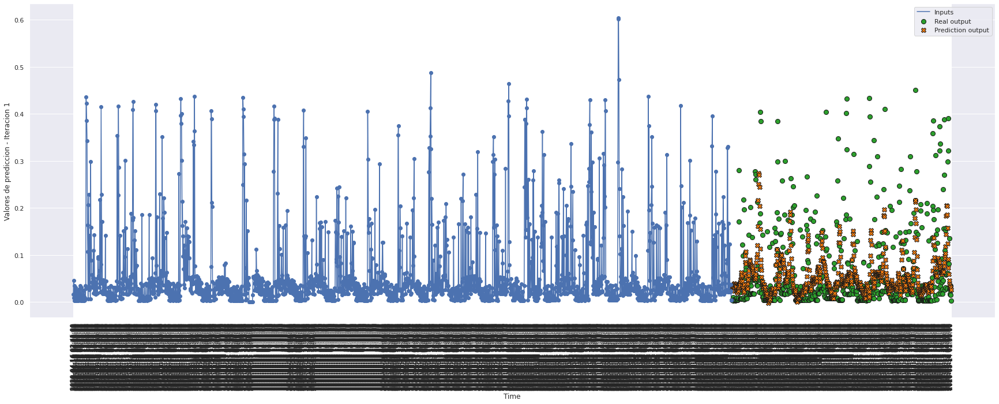

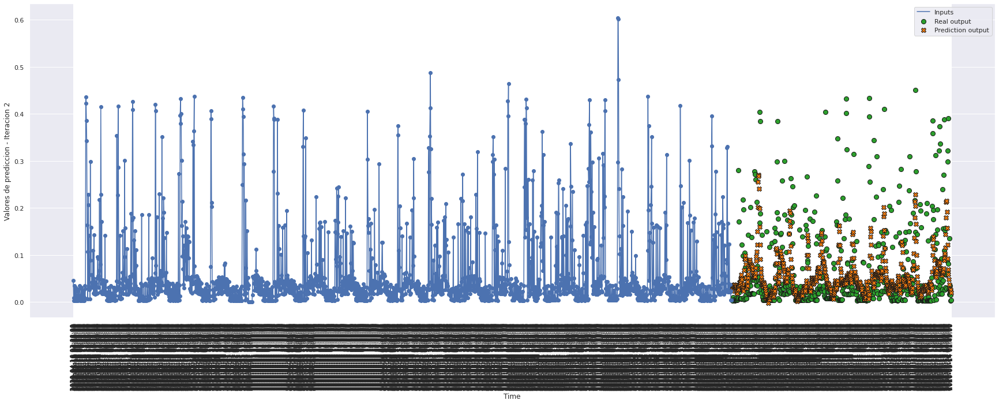

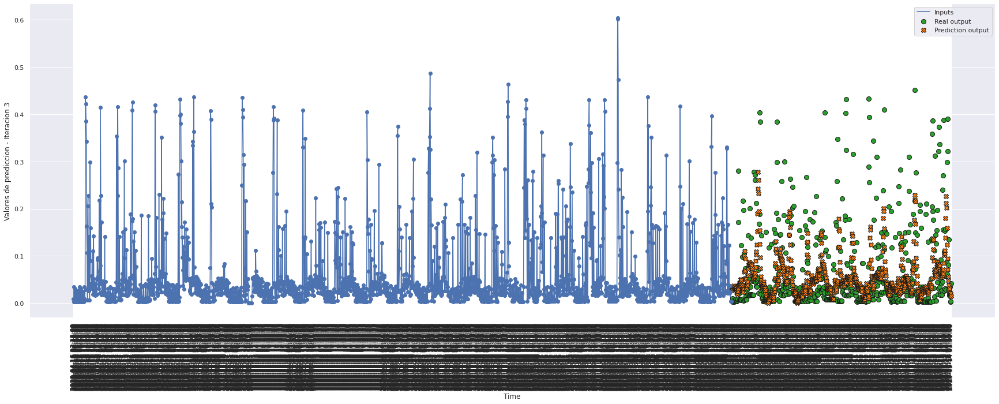

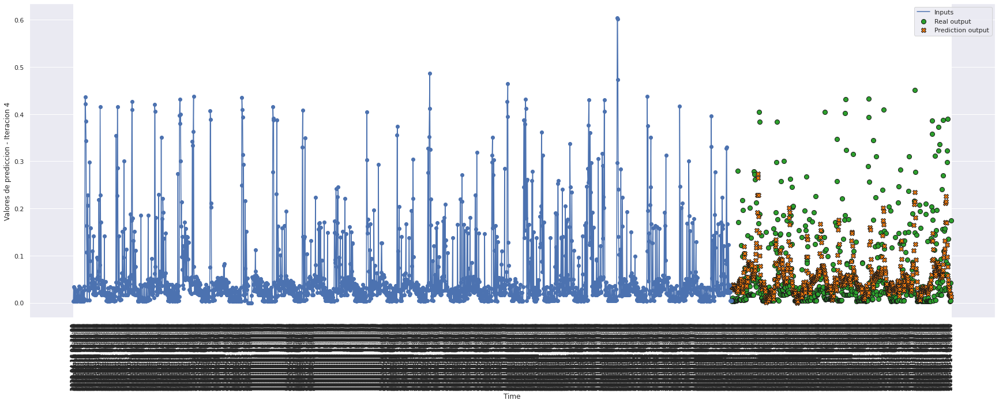

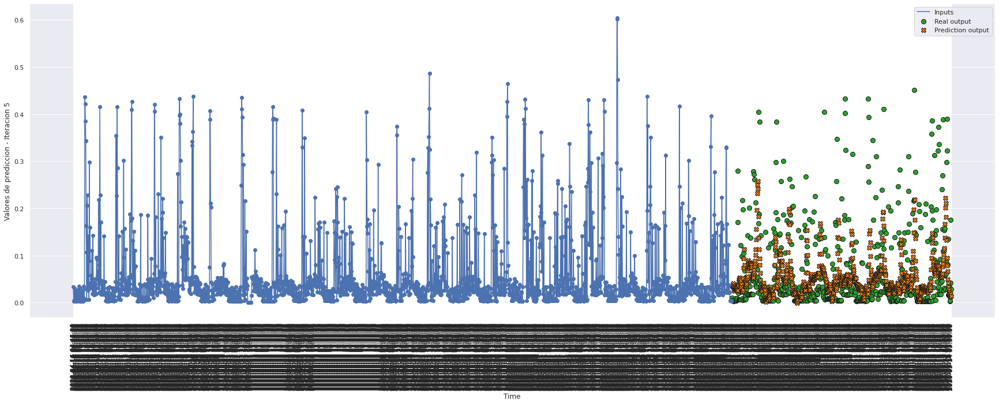

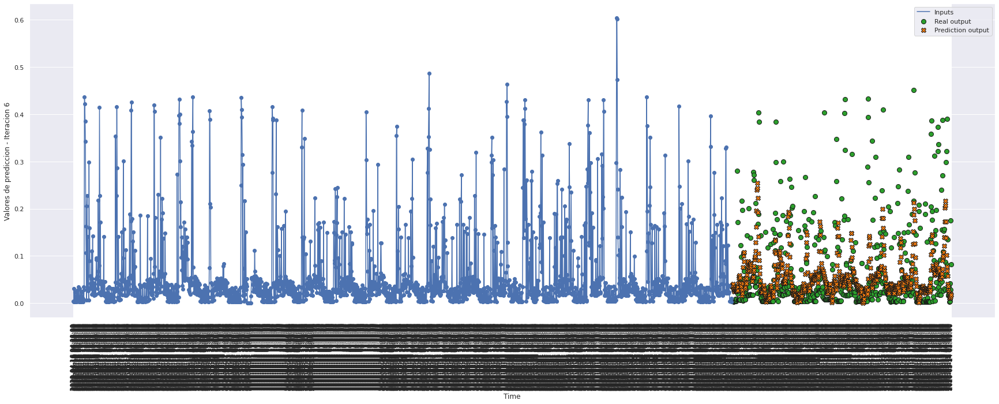

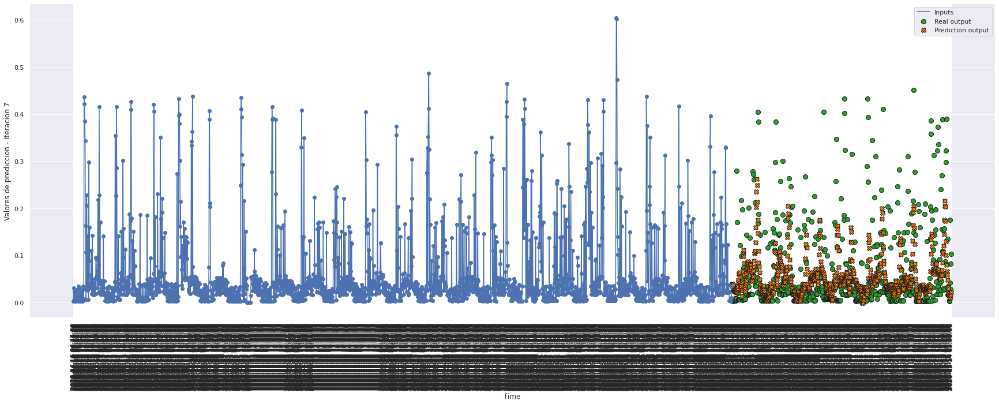

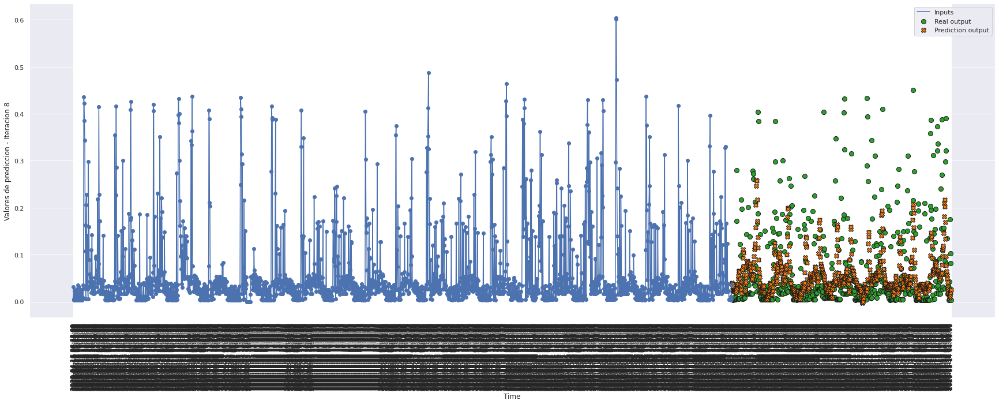

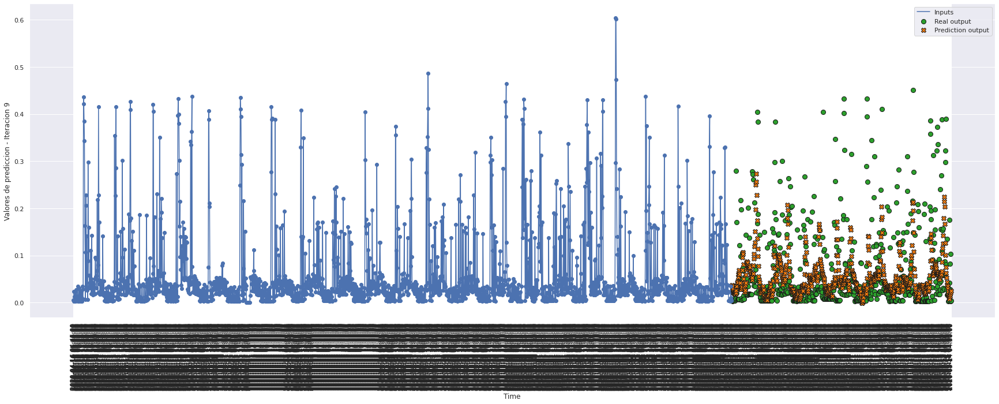

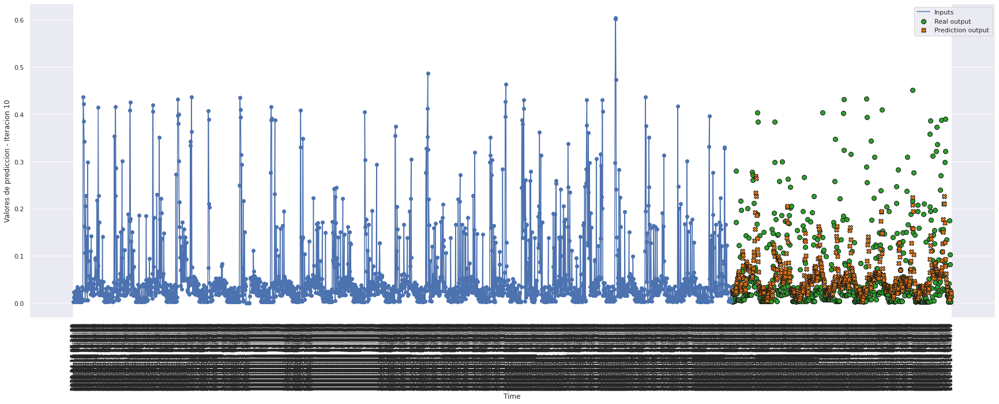

In [43]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict2, 10, 0)

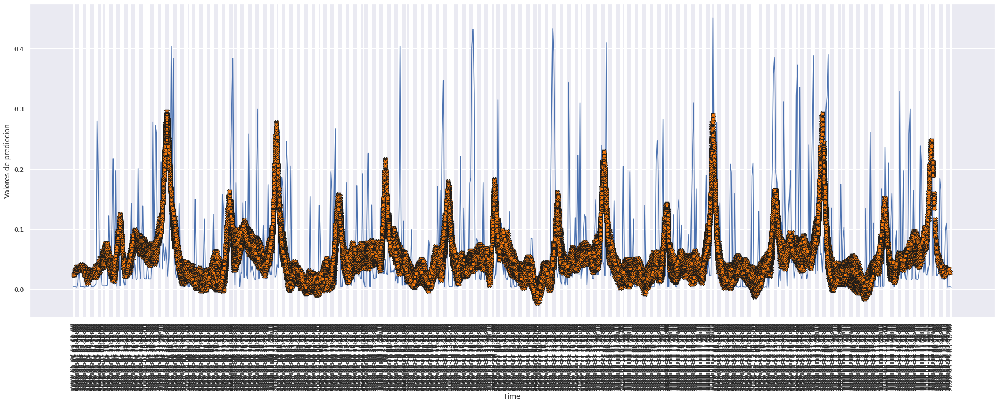

In [44]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 100)

# MODELO 10: GRU UNA CAPA

### Construimos el modelo

In [45]:
def build_model10():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [46]:
model10 = build_model10()
model10.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 128)               52608     
                                                                 
 dense_1 (Dense)             (None, 672)               86688     
                                                                 
Total params: 139,296
Trainable params: 139,296
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [47]:
history10 = model10.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
333/333 [==============================] - 39s 115ms/step - loss: 0.0066 - mae: 0.0480 - mse: 0.0066 - smape: 0.8565 - val_loss: 0.0067 - val_mae: 0.0491 - val_mse: 0.0067 - val_smape: 0.9506
Epoch 2/200
333/333 [==============================] - 37s 112ms/step - loss: 0.0060 - mae: 0.0469 - mse: 0.0060 - smape: 0.8453 - val_loss: 0.0067 - val_mae: 0.0479 - val_mse: 0.0067 - val_smape: 0.8863
Epoch 3/200
333/333 [==============================] - 37s 112ms/step - loss: 0.0058 - mae: 0.0457 - mse: 0.0058 - smape: 0.8174 - val_loss: 0.0068 - val_mae: 0.0488 - val_mse: 0.0068 - val_smape: 0.9203
Epoch 4/200
333/333 [==============================] - 37s 112ms/step - loss: 0.0056 - mae: 0.0446 - mse: 0.0056 - smape: 0.7924 - val_loss: 0.0069 - val_mae: 0.0481 - val_mse: 0.0069 - val_smape: 0.8797
Epoch 5/200
333/333 [==============================] - 38s 113ms/step - loss: 0.0055 - mae: 0.0439 - mse: 0.0055 - smape: 0.7835 - val_loss: 0.0069 - val_mae: 0.0477 - val_mse: 0.0069 

333/333 [==============================] - 37s 112ms/step - loss: 0.0050 - mae: 0.0415 - mse: 0.0050 - smape: 0.7548 - val_loss: 0.0077 - val_mae: 0.0481 - val_mse: 0.0077 - val_smape: 0.8502
Epoch 42/200
333/333 [==============================] - 37s 111ms/step - loss: 0.0050 - mae: 0.0414 - mse: 0.0050 - smape: 0.7547 - val_loss: 0.0078 - val_mae: 0.0485 - val_mse: 0.0078 - val_smape: 0.8534
Epoch 43/200
333/333 [==============================] - 37s 112ms/step - loss: 0.0050 - mae: 0.0414 - mse: 0.0050 - smape: 0.7553 - val_loss: 0.0076 - val_mae: 0.0478 - val_mse: 0.0076 - val_smape: 0.8367
Epoch 44/200
333/333 [==============================] - 37s 112ms/step - loss: 0.0050 - mae: 0.0415 - mse: 0.0050 - smape: 0.7556 - val_loss: 0.0075 - val_mae: 0.0475 - val_mse: 0.0075 - val_smape: 0.8325
Epoch 45/200
333/333 [==============================] - 38s 114ms/step - loss: 0.0050 - mae: 0.0414 - mse: 0.0050 - smape: 0.7552 - val_loss: 0.0079 - val_mae: 0.0487 - val_mse: 0.0079 - val_sm

In [48]:
hist10 = pd.DataFrame(history10.history)
hist10['epoch'] = history10.epoch
hist10

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006588,0.047996,0.006588,0.856540,0.006748,0.049115,0.006748,0.950558,0
1,0.006019,0.046920,0.006019,0.845280,0.006726,0.047870,0.006726,0.886316,1
2,0.005798,0.045651,0.005798,0.817439,0.006815,0.048801,0.006815,0.920279,2
3,0.005621,0.044601,0.005621,0.792396,0.006879,0.048087,0.006879,0.879658,3
4,0.005514,0.043891,0.005514,0.783505,0.006921,0.047687,0.006921,0.865211,4
5,0.005438,0.043380,0.005438,0.776642,0.006871,0.046873,0.006871,0.850711,5
6,0.005385,0.043042,0.005385,0.771239,0.006940,0.046936,0.006940,0.850549,6
7,0.005349,0.042864,0.005349,0.768209,0.006934,0.046539,0.006934,0.838003,7
8,0.005319,0.042696,0.005319,0.764641,0.006936,0.046690,0.006936,0.826783,8
9,0.005296,0.042590,0.005296,0.762699,0.006844,0.046037,0.006844,0.818870,9


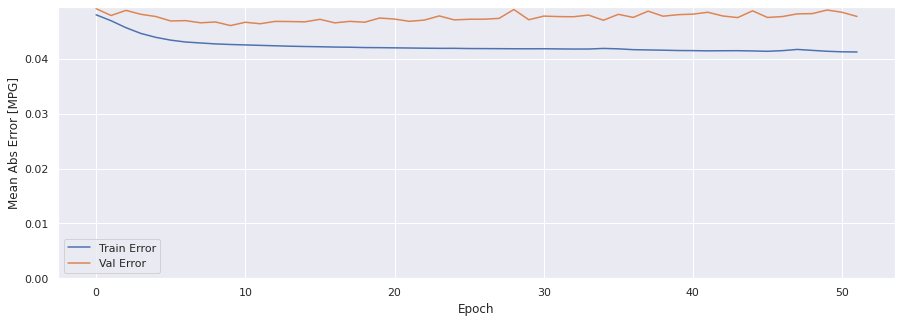

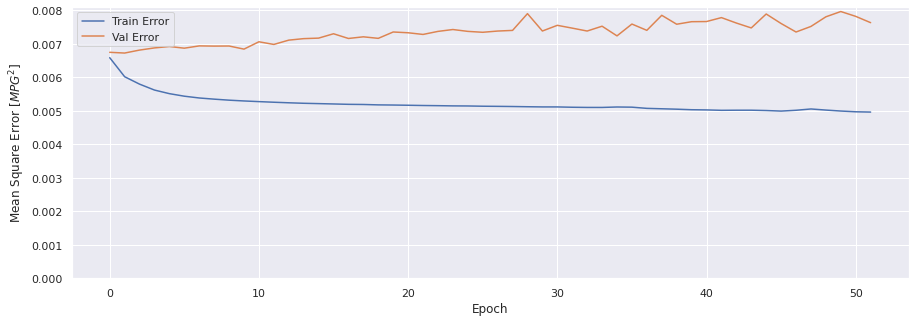

In [49]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history10)

### Evaluar predicciones

In [50]:
score_train10 = model10.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train10[0]}')
print(f'MAE:{score_train10[1]}')
print(f'MSE:{score_train10[2]}')
print(f'SMAPE:{score_train10[3]}')

1329/1329 [==============================] - 46s 34ms/step - loss: 0.0049 - mae: 0.0411 - mse: 0.0049 - smape: 0.7526
Loss:0.004942687228322029
MAE:0.04108623042702675
MSE:0.004942687228322029
SMAPE:0.752633810043335


In [51]:
score_val10 = model10.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val10[0]}')
print(f'MAE:{score_val10[1]}')
print(f'MSE:{score_val10[2]}')
print(f'SMAPE:{score_val10[3]}')

219/219 [==============================] - 9s 39ms/step - loss: 0.0076 - mae: 0.0477 - mse: 0.0076 - smape: 0.8342
Loss:0.007633404806256294
MAE:0.04769781604409218
MSE:0.007633404806256294
SMAPE:0.8342222571372986


In [52]:
score_test10 = model10.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test10[0]}')
print(f'MAE:{score_test10[1]}')
print(f'MSE:{score_test10[2]}')
print(f'SMAPE:{score_test10[3]}')

219/219 [==============================] - 8s 38ms/step - loss: 0.0064 - mae: 0.0465 - mse: 0.0064 - smape: 0.7749
Loss:0.006393721792846918
MAE:0.046529412269592285
MSE:0.006393721792846918
SMAPE:0.7748883962631226


### Comparativa de resultados

In [53]:
result = hist10.iloc[-1]
comparativa10 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test10[1], score_test10[2], score_test10[3], math.sqrt(score_test10[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa10.style.set_caption("Método de ventana de varios pasos - GRU una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.041230,0.004964,0.754154,0.070452
VALIDACION,0.047698,0.007633,0.834854,0.087369
TEST,0.046529,0.006394,0.774888,0.079961


### Obtener predicciones

In [54]:
trainPredict10 = model10.predict(scaled_trainX)
testPredict10 = model10.predict(scaled_testX)

### Visualización de las predicciones

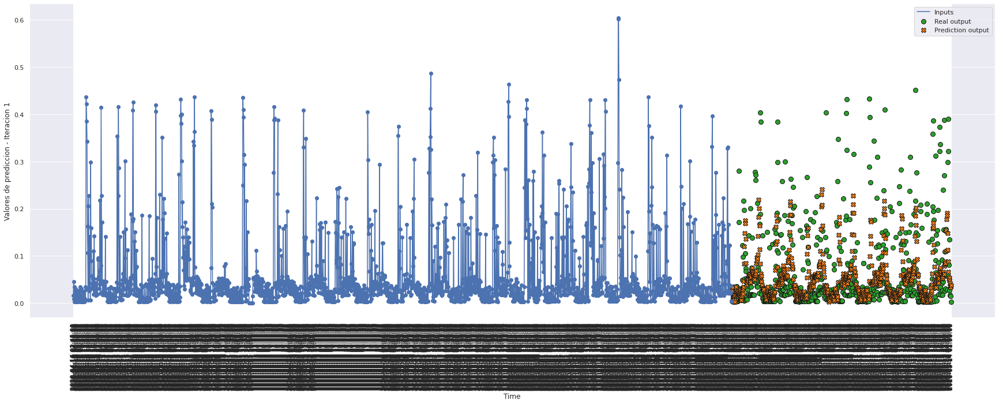

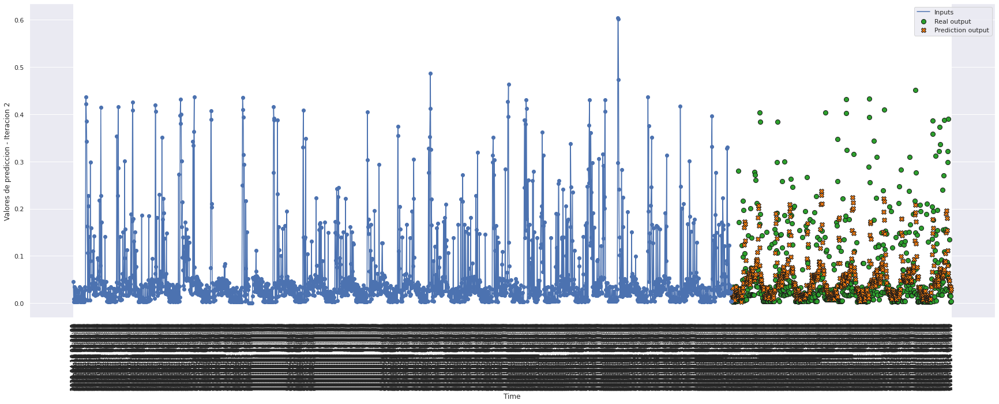

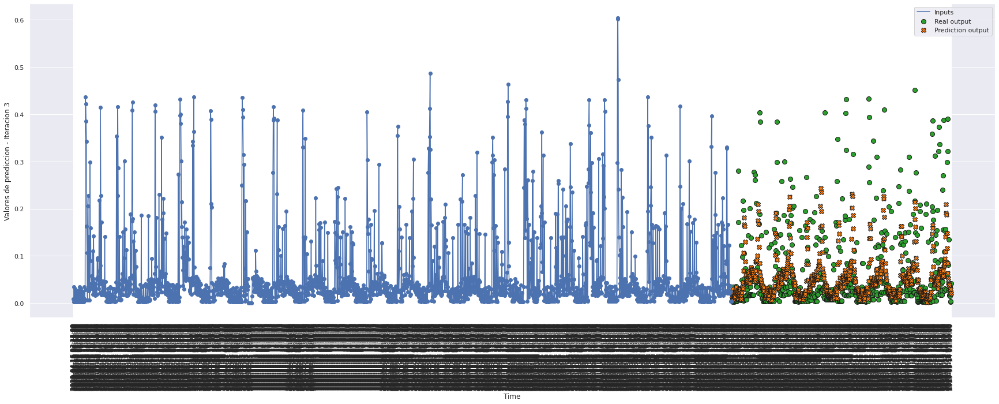

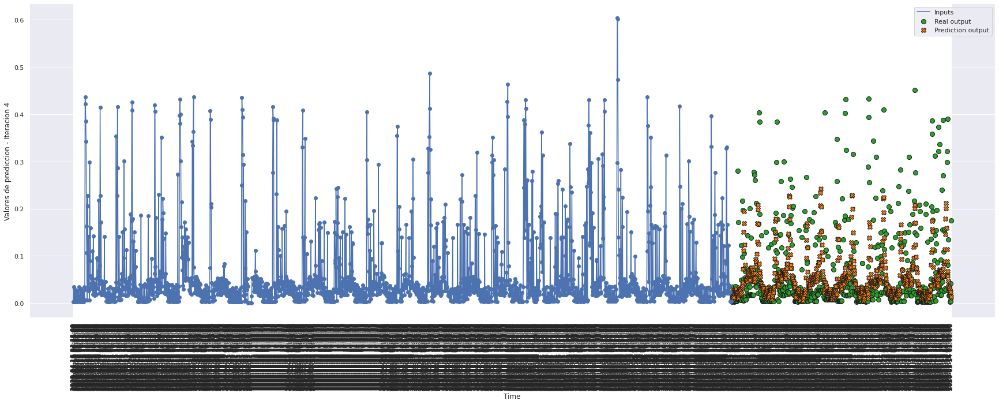

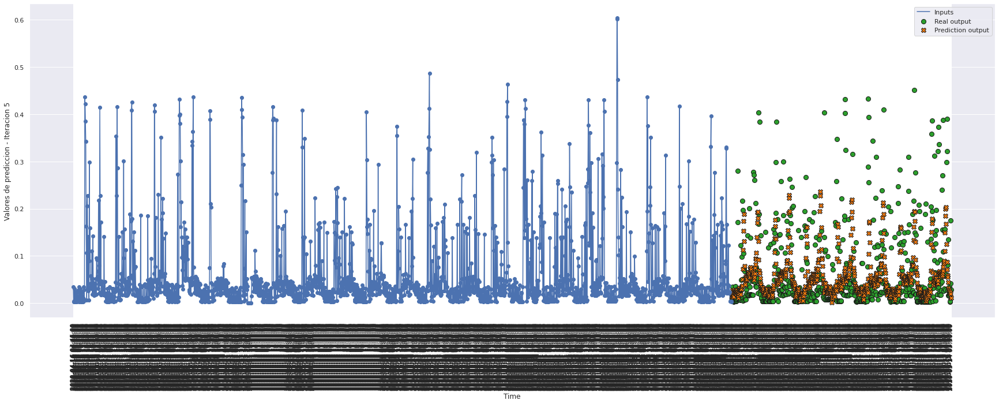

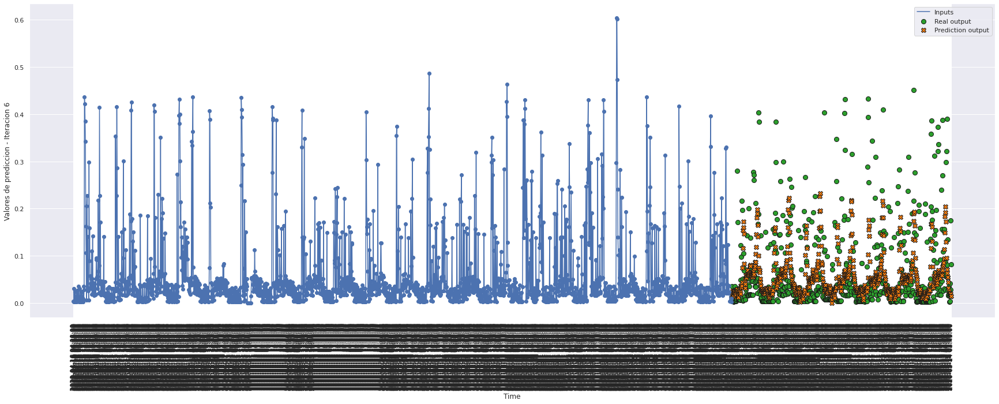

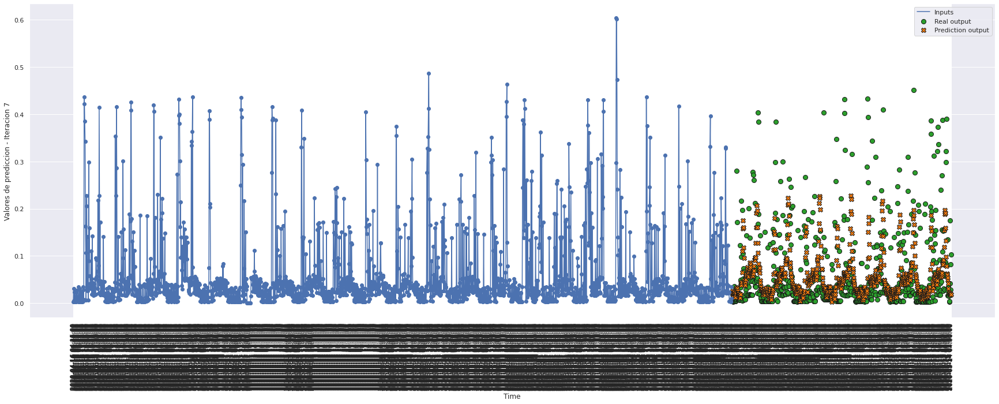

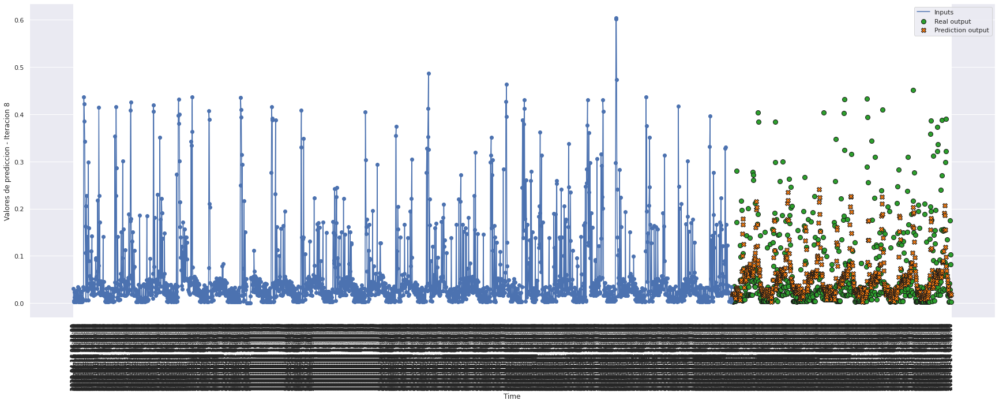

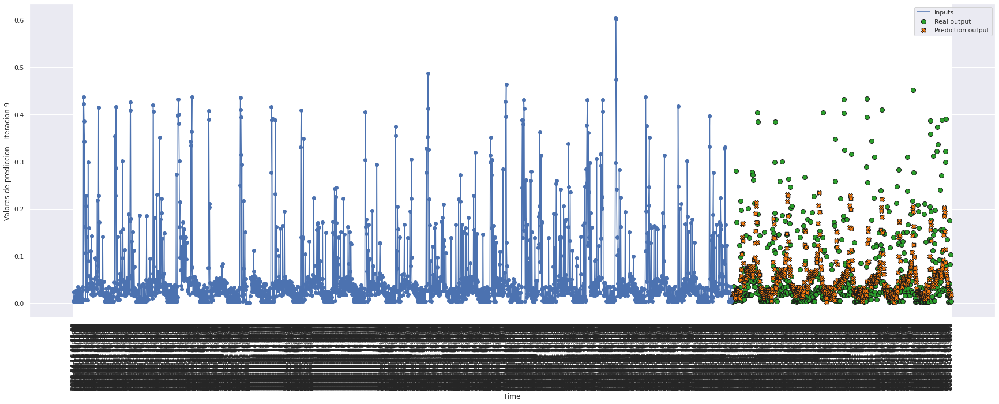

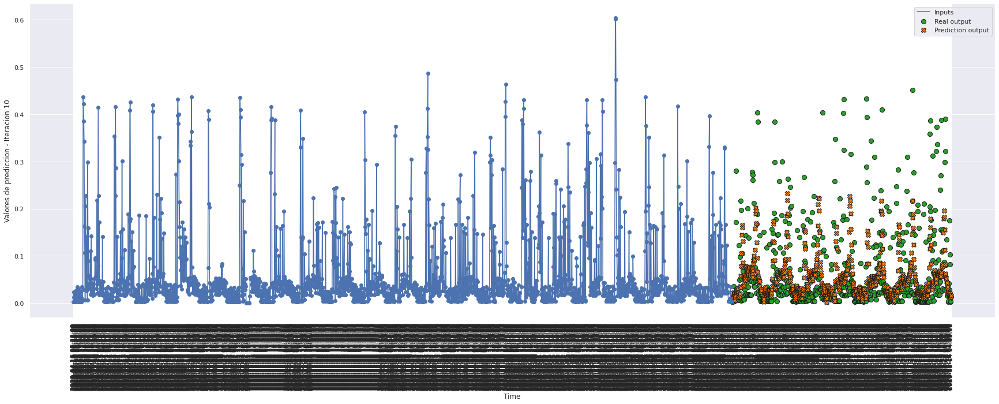

In [55]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict10, 10, 0)

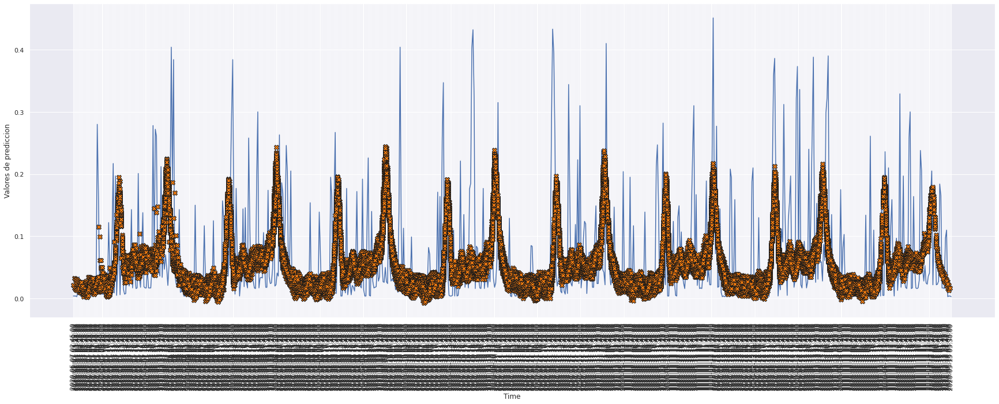

In [56]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 100)

# MODELO 11: GRU DOS CAPAS

### Construimos el modelo

In [57]:
def build_model11():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh', return_sequences=True),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [58]:
model11 = build_model11()
model11.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 2016, 128)         52608     
                                                                 
 gru_2 (GRU)                 (None, 128)               99072     
                                                                 
 dense_2 (Dense)             (None, 672)               86688     
                                                                 
Total params: 238,368
Trainable params: 238,368
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [59]:
history11 = model11.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
333/333 [==============================] - 76s 222ms/step - loss: 0.0064 - mae: 0.0478 - mse: 0.0064 - smape: 0.8587 - val_loss: 0.0067 - val_mae: 0.0495 - val_mse: 0.0067 - val_smape: 0.9588
Epoch 2/200
333/333 [==============================] - 73s 219ms/step - loss: 0.0059 - mae: 0.0464 - mse: 0.0059 - smape: 0.8338 - val_loss: 0.0068 - val_mae: 0.0494 - val_mse: 0.0068 - val_smape: 0.9419
Epoch 3/200
333/333 [==============================] - 73s 218ms/step - loss: 0.0056 - mae: 0.0447 - mse: 0.0056 - smape: 0.7954 - val_loss: 0.0069 - val_mae: 0.0478 - val_mse: 0.0069 - val_smape: 0.8665
Epoch 4/200
333/333 [==============================] - 73s 218ms/step - loss: 0.0055 - mae: 0.0437 - mse: 0.0055 - smape: 0.7822 - val_loss: 0.0069 - val_mae: 0.0472 - val_mse: 0.0069 - val_smape: 0.8589
Epoch 5/200
333/333 [==============================] - 73s 218ms/step - loss: 0.0054 - mae: 0.0432 - mse: 0.0054 - smape: 0.7739 - val_loss: 0.0069 - val_mae: 0.0468 - val_mse: 0.0069 

333/333 [==============================] - 73s 218ms/step - loss: 0.0048 - mae: 0.0406 - mse: 0.0048 - smape: 0.7539 - val_loss: 0.0076 - val_mae: 0.0478 - val_mse: 0.0076 - val_smape: 0.8411
Epoch 42/200
333/333 [==============================] - 74s 222ms/step - loss: 0.0047 - mae: 0.0406 - mse: 0.0047 - smape: 0.7547 - val_loss: 0.0076 - val_mae: 0.0479 - val_mse: 0.0076 - val_smape: 0.8437
Epoch 43/200
333/333 [==============================] - 72s 217ms/step - loss: 0.0047 - mae: 0.0405 - mse: 0.0047 - smape: 0.7554 - val_loss: 0.0075 - val_mae: 0.0482 - val_mse: 0.0075 - val_smape: 0.8570
Epoch 44/200
333/333 [==============================] - 74s 223ms/step - loss: 0.0047 - mae: 0.0405 - mse: 0.0047 - smape: 0.7565 - val_loss: 0.0075 - val_mae: 0.0486 - val_mse: 0.0075 - val_smape: 0.8635
Epoch 45/200
333/333 [==============================] - 75s 224ms/step - loss: 0.0047 - mae: 0.0405 - mse: 0.0047 - smape: 0.7575 - val_loss: 0.0076 - val_mae: 0.0485 - val_mse: 0.0076 - val_sm

In [60]:
hist11 = pd.DataFrame(history11.history)
hist11['epoch'] = history11.epoch
hist11

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006435,0.047785,0.006435,0.858702,0.006735,0.049532,0.006735,0.958800,0
1,0.005929,0.046363,0.005929,0.833768,0.006798,0.049384,0.006798,0.941948,1
2,0.005634,0.044663,0.005634,0.795414,0.006852,0.047787,0.006852,0.866497,2
3,0.005490,0.043721,0.005490,0.782229,0.006945,0.047240,0.006945,0.858865,3
4,0.005406,0.043174,0.005406,0.773867,0.006935,0.046791,0.006935,0.832436,4
5,0.005354,0.042878,0.005354,0.768776,0.006961,0.047111,0.006961,0.840679,5
6,0.005319,0.042667,0.005319,0.763713,0.006983,0.046480,0.006983,0.822502,6
7,0.005290,0.042530,0.005290,0.761097,0.006990,0.046202,0.006990,0.824655,7
8,0.005262,0.042420,0.005262,0.760148,0.007017,0.046423,0.007017,0.818157,8
9,0.005244,0.042335,0.005244,0.759390,0.007124,0.046788,0.007124,0.824382,9


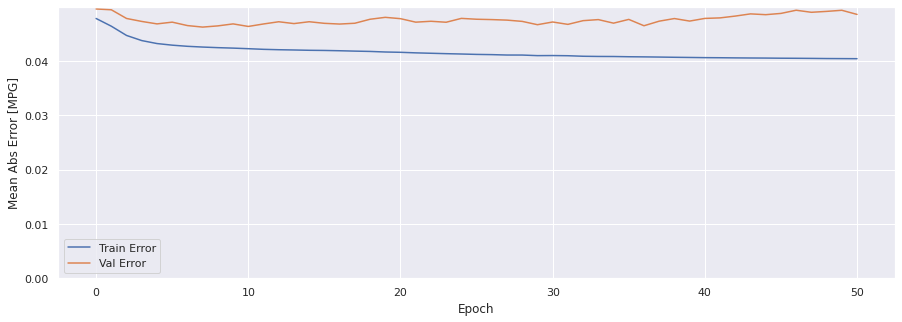

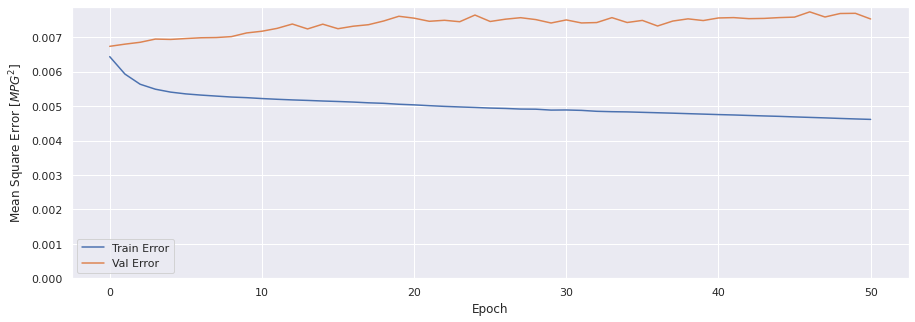

In [61]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [62]:
score_train11 = model11.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train11[0]}')
print(f'MAE:{score_train11[1]}')
print(f'MSE:{score_train11[2]}')
print(f'SMAPE:{score_train11[3]}')

1329/1329 [==============================] - 86s 64ms/step - loss: 0.0046 - mae: 0.0404 - mse: 0.0046 - smape: 0.7634
Loss:0.00460263155400753
MAE:0.04036853834986687
MSE:0.00460263155400753
SMAPE:0.7634138464927673


In [63]:
score_val11 = model11.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val11[0]}')
print(f'MAE:{score_val11[1]}')
print(f'MSE:{score_val11[2]}')
print(f'SMAPE:{score_val11[3]}')

219/219 [==============================] - 16s 71ms/step - loss: 0.0075 - mae: 0.0485 - mse: 0.0075 - smape: 0.8793
Loss:0.007528544403612614
MAE:0.04853344336152077
MSE:0.007528544403612614
SMAPE:0.8793193101882935


In [64]:
score_test11 = model11.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test11[0]}')
print(f'MAE:{score_test11[1]}')
print(f'MSE:{score_test11[2]}')
print(f'SMAPE:{score_test11[3]}')

219/219 [==============================] - 16s 72ms/step - loss: 0.0067 - mae: 0.0474 - mse: 0.0067 - smape: 0.7963
Loss:0.006684718653559685
MAE:0.04744953289628029
MSE:0.006684718653559685
SMAPE:0.7963212132453918


### Comparativa de resultados

In [65]:
result = hist11.iloc[-1]
comparativa11 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test11[1], score_test11[2], score_test11[3], math.sqrt(score_test11[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa11.style.set_caption("Método de ventana de varios pasos - GRU dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.040390,0.004613,0.764391,0.067921
VALIDACION,0.048533,0.007529,0.879700,0.086767
TEST,0.047450,0.006685,0.796321,0.081760


### Obtener predicciones

In [66]:
trainPredict11 = model11.predict(scaled_trainX)
testPredict11 = model11.predict(scaled_testX)

### Visualización de las predicciones

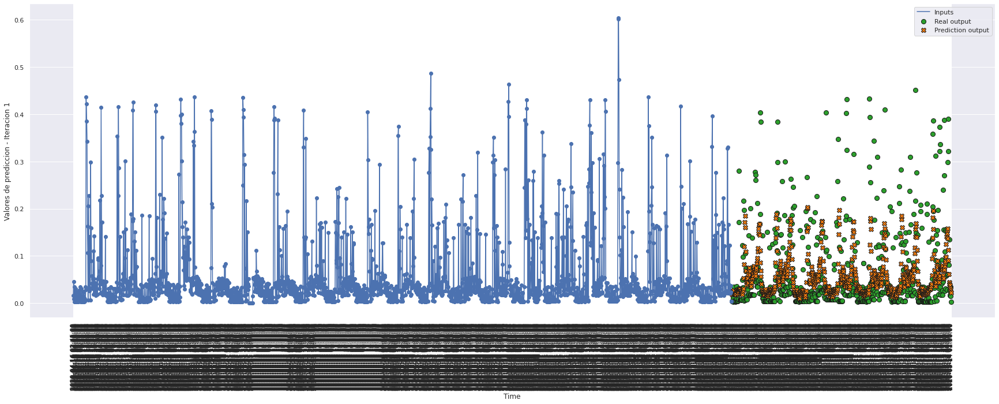

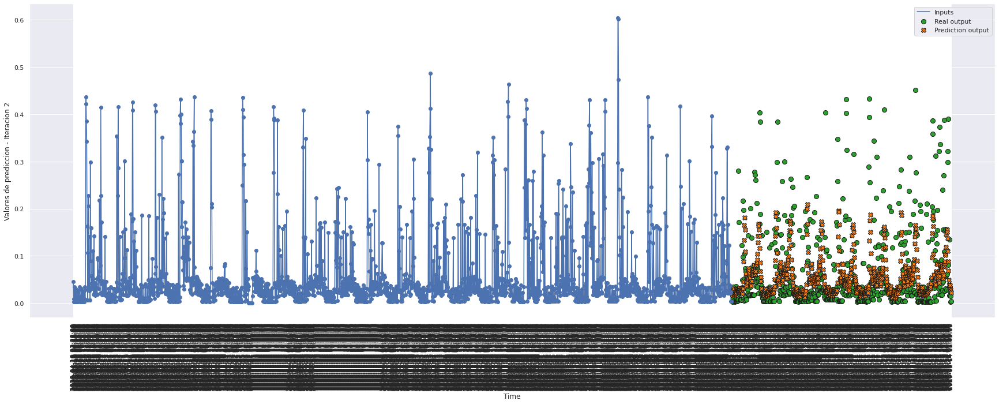

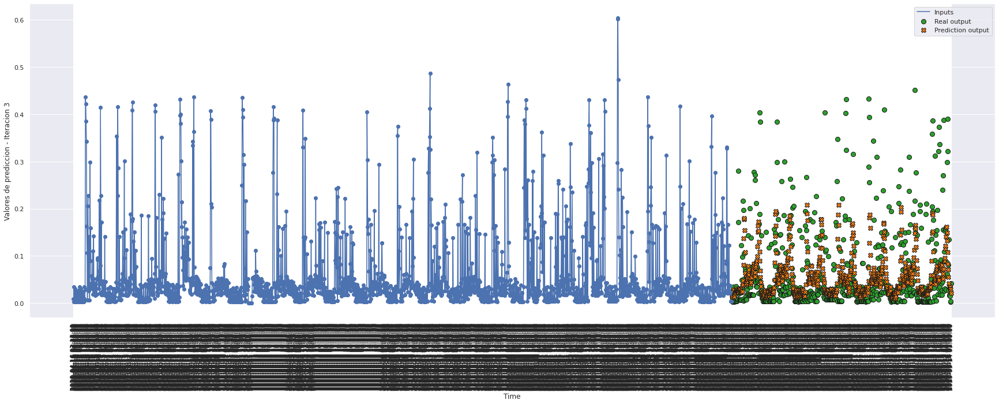

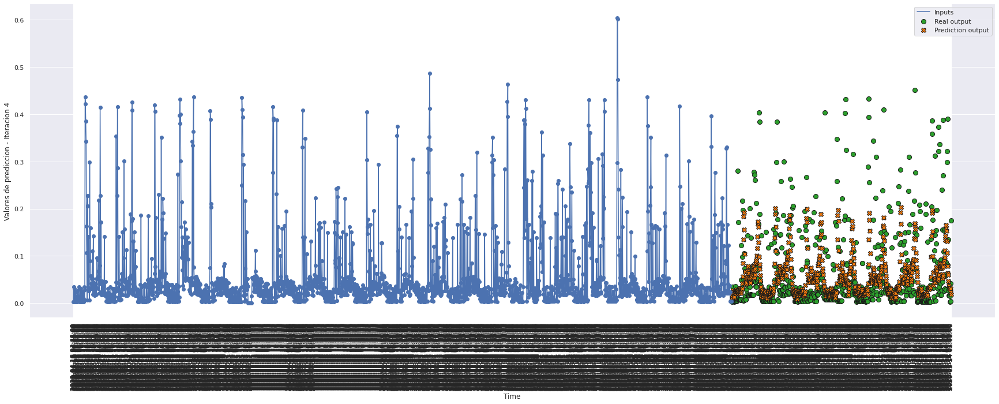

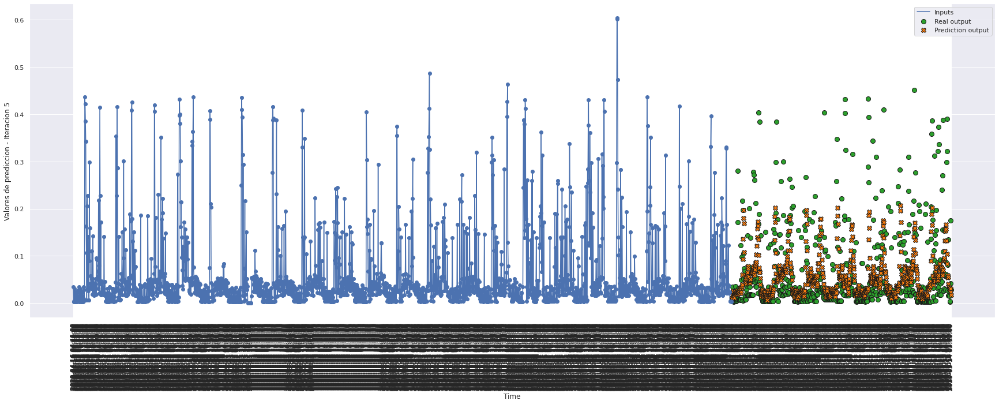

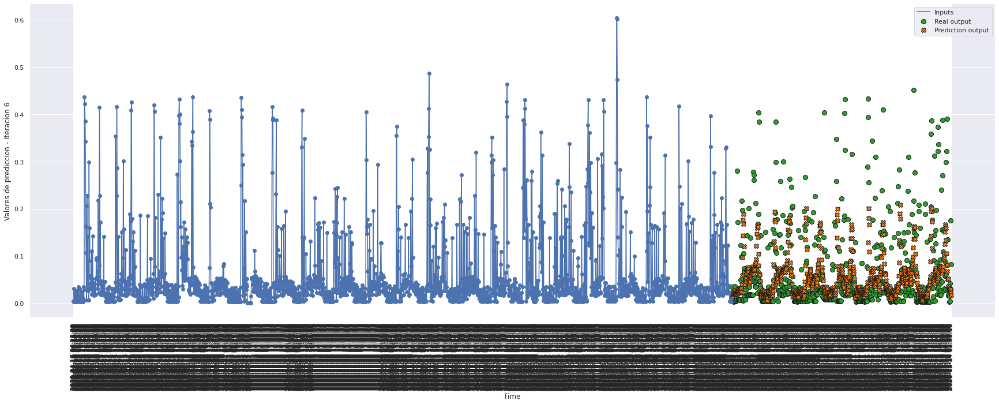

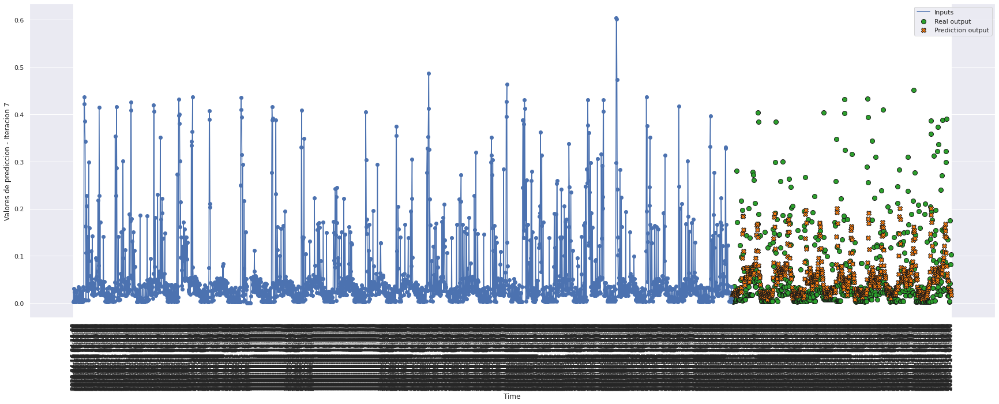

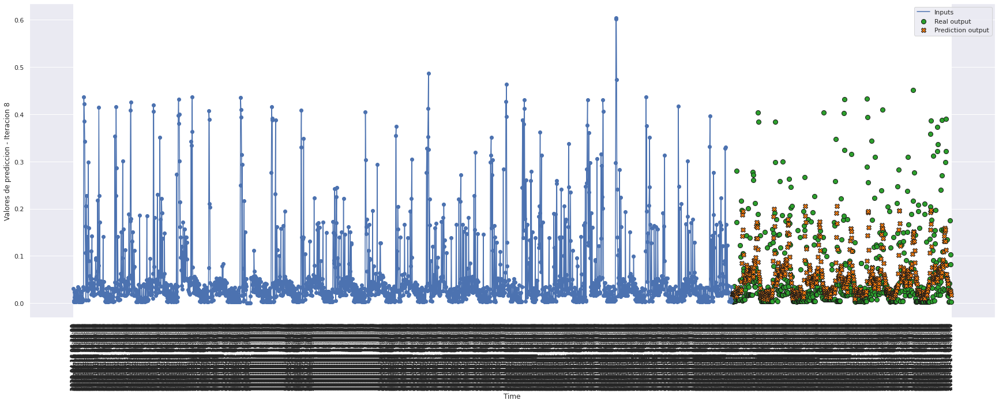

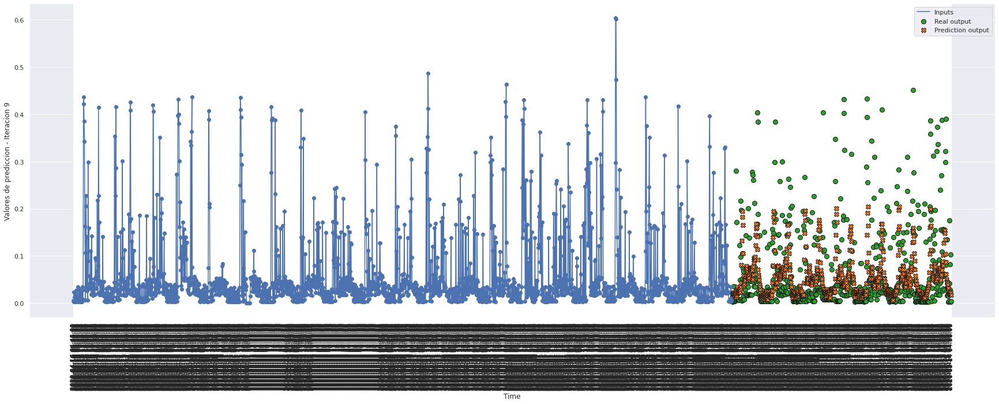

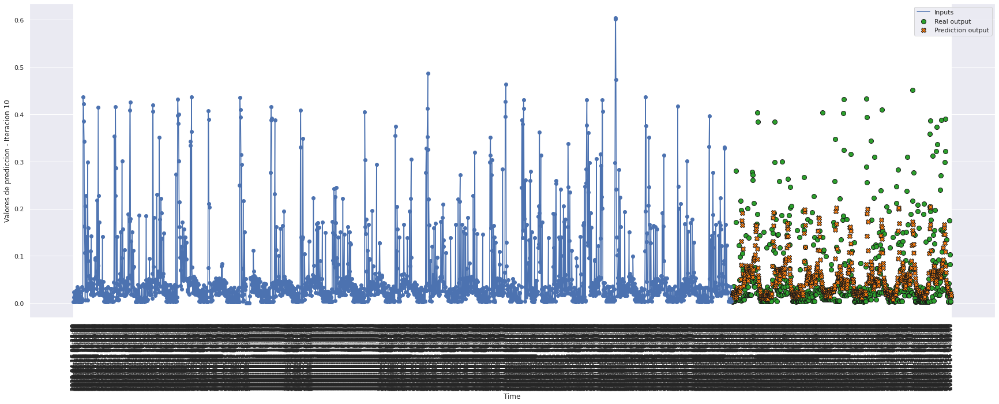

In [67]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict11, 10, 0)

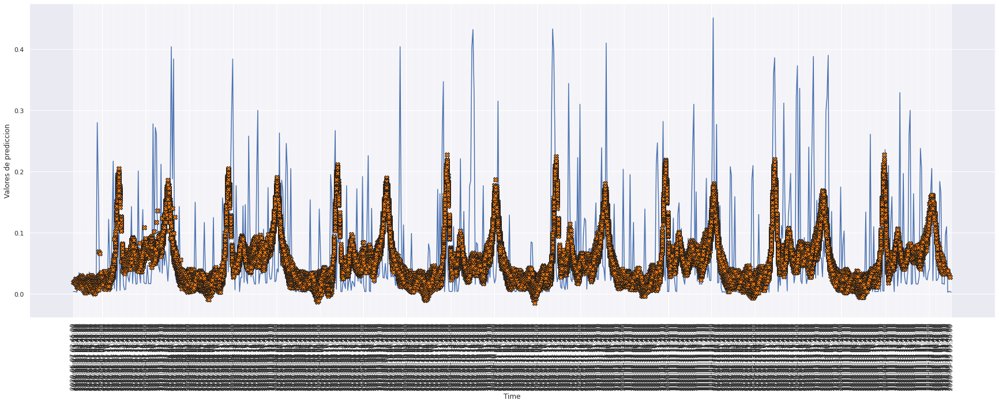

In [68]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 100)

# Comparación de modelos

In [69]:
idx = ['LSTM 2 Layer', 'GRU 1 Layer', 'GRU 2 Layer']

col = ['TR_MAE', 'TR_MSE', 'TR_SMAPE', 'TR_RMSE',
       'V_MAE', 'V_MSE', 'V_SMAPE', 'V_RMSE',
       'TS_MAE', 'TS_MSE', 'TS_SMAPE', 'TS_RMSE']

datos = [[score_train2[1], score_train2[2], score_train2[3], math.sqrt(score_train2[2]),
            score_val2[1],   score_val2[2],   score_val2[3],   math.sqrt(score_val2[2]),
           score_test2[1],  score_test2[2],  score_test2[3],  math.sqrt(score_test2[2])],
         [score_train10[1], score_train10[2], score_train10[3], math.sqrt(score_train10[2]),
            score_val10[1],   score_val10[2],   score_val10[3],   math.sqrt(score_val10[2]),
           score_test10[1],  score_test10[2],  score_test10[3],  math.sqrt(score_test10[2])],
         [score_train11[1], score_train11[2], score_train11[3], math.sqrt(score_train11[2]),
            score_val11[1],   score_val11[2],   score_val11[3],   math.sqrt(score_val11[2]),
           score_test11[1],  score_test11[2],  score_test11[3],  math.sqrt(score_test11[2])]]

comparativa = pd.DataFrame(datos, columns = col, index = idx)
comparativa.style.set_caption("Tabla de comparación de todos los modelos - Método de ventana fecha y valor 2016 - 672")

,TR_MAE,TR_MSE,TR_SMAPE,TR_RMSE,V_MAE,V_MSE,V_SMAPE,V_RMSE,TS_MAE,TS_MSE,TS_SMAPE,TS_RMSE
LSTM 2 Layer,0.039301,0.004068,0.786912,0.063782,0.051573,0.008178,0.952437,0.090435,0.049109,0.006894,0.848378,0.083027
GRU 1 Layer,0.041086,0.004943,0.752634,0.070304,0.047698,0.007633,0.834222,0.087369,0.046529,0.006394,0.774888,0.079961
GRU 2 Layer,0.040369,0.004603,0.763414,0.067843,0.048533,0.007529,0.879319,0.086767,0.047450,0.006685,0.796321,0.081760


<AxesSubplot:title={'center':'Comparativa del error en los modelos para la semana del método de ventana de varios pasos fecha y valor'}>

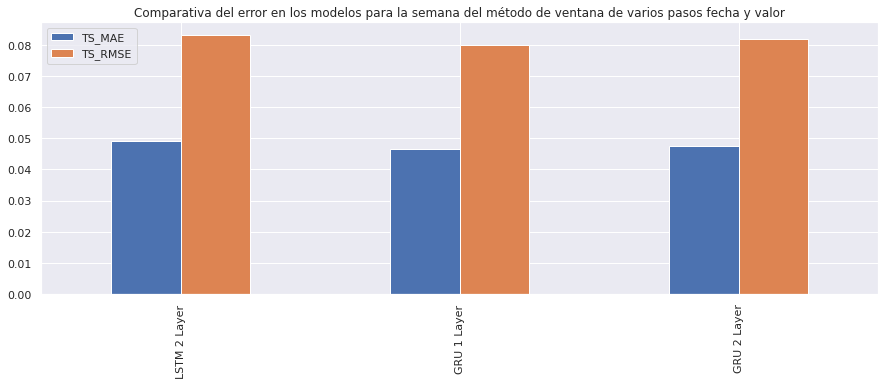

In [77]:
sns.set(rc = {'figure.figsize':(15,5)})
comparativa.loc[:, ['TS_MAE', 'TS_RMSE']].plot(kind='bar', title = 'Comparativa del error en los modelos para la semana del método de ventana de varios pasos fecha y valor')

<AxesSubplot:title={'center':'Comparativa del error porcentual absoluto medio simétrico para la semana del método de ventana de varios pasos fecha y valor'}>

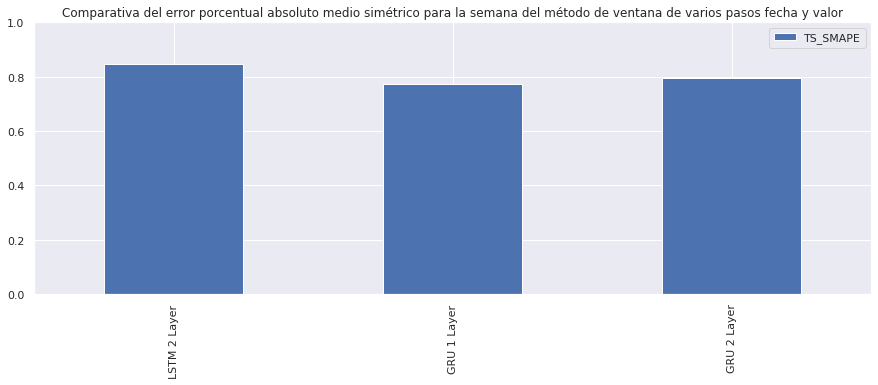

In [78]:
sns.set(rc = {'figure.figsize':(15,5)})
comparativa.loc[:, 'TS_SMAPE'].plot(kind='bar', legend=(['SMAPE']), ylim=(0, 1), 
                    title = 'Comparativa del error porcentual absoluto medio simétrico para la semana del método de ventana de varios pasos fecha y valor')

# Elección de modelo

In [74]:
model2.save('../../models/datetime_and_value/weekModel/1/')

INFO:tensorflow:Assets written to: ../../models/datetime_and_value/weekModel/1/assets


INFO:tensorflow:Assets written to: ../../models/datetime_and_value/weekModel/1/assets
